In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo

Cloning into 'yolov5'...
remote: Enumerating objects: 14654, done.
remote: Counting objects: 100% (208/208), done.
remote: Compressing objects: 100% (99/99), done.
remote: Total 14654 (delta 131), reused 174 (delta 109), pack-reused 14446
Receiving objects: 100% (14654/14654), 13.52 MiB | 31.67 MiB/s, done.
Resolving deltas: 100% (10104/10104), done.


In [ ]:
!pip install roboflow

%cd yolov5

from roboflow import Roboflow
rf = Roboflow(api_key="oa8agbj4cGuh3zte6w4F")
project = rf.workspace("roboflow-workspace-znzul").project("logo-detection-pquwo")
dataset = project.version(4).download("yolov5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 41 kB 222 kB/s 
     |████████████████████████████████| 178 kB 8.4 MB/s 
     |████████████████████████████████| 67 kB 7.8 MB/s 
     |████████████████████████████████| 54 kB 3.5 MB/s 
     |████████████████████████████████| 138 kB 65.2 MB/s 
     |████████████████████████████████| 145 kB 66.9 MB/s 
     |████████████████████████████████| 62 kB 1.7 MB/s 
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9675 sha256=a7bb0a1a5975d4602f4dee92c1f55b0438aa56315e4dd364d2847b7f12611669
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built wget
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3
  Attempting uninstall: certifi
    Found existing installation: certif

/content/yolov5
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Logo-Detection-4 in yolov5pytorch:: 100%|██████████| 2438/2438 [00:00<00:00, 2519.31it/s]


In [ ]:
!pip install -qr requirements.txt  # install dependencies

     |████████████████████████████████| 1.6 MB 5.0 MB/s 


In [ ]:
import torch

print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.12.1+cu113 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


In [ ]:
%cat {dataset.location}/data.yaml

names:
- logo
nc: 1
roboflow:
  license: CC BY 4.0
  project: logo-detection-pquwo
  url: https://universe.roboflow.com/roboflow-workspace-znzul/logo-detection-pquwo/dataset/4
  version: 4
  workspace: roboflow-workspace-znzul
test: ../test/images
train: Logo-Detection-4/train/images
val: Logo-Detection-4/valid/images


In [ ]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolov5/models/yolov5s_logo_detection.yaml

# Parameters
nc: 1  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]


In [ ]:
SIZE = 640

In [ ]:
%cd /content/yolov5/
!python train.py --img {SIZE} --batch 32 --epochs 500 --data {dataset.location}/data.yaml --cfg ./models/yolov5s_logo_detection.yaml --weights '' --name yolov5s_logo_results  --cache

/content/yolov5
train: weights=, cfg=./models/yolov5s_logo_detection.yaml, data=/content/yolov5/Logo-Detection-4/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=500, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_logo_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-231-g0039870 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs/train

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
from IPython.display import Image, display

GROUND TRUTH TRAINING DATA:


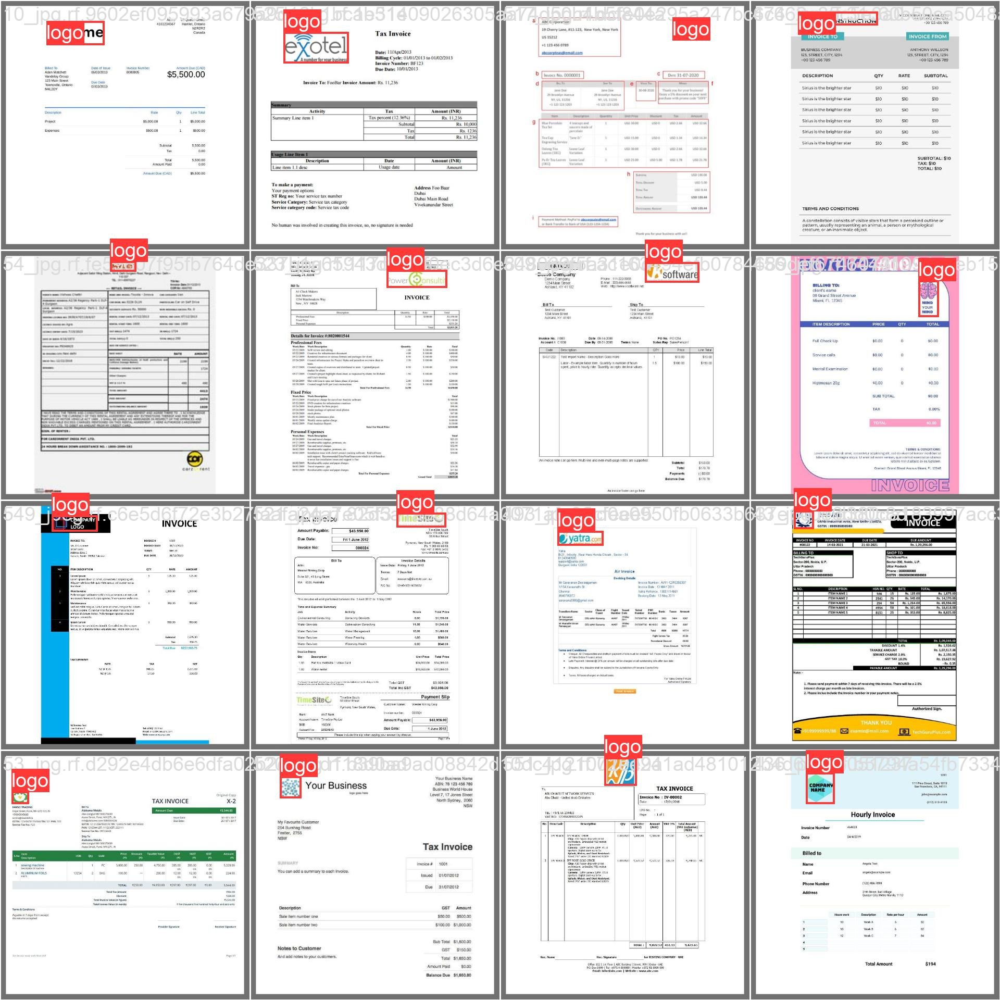

In [ ]:
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_logo_results/val_batch0_labels.jpg', width=900)

In [ ]:
!python detect.py --weights runs/train/yolov5s_logo_results/weights/best.pt --img {SIZE} --conf 0.05 --source {dataset.location}/test/images --save-txt --save-conf

detect: weights=['runs/train/yolov5s_logo_results/weights/best.pt'], source=/content/yolov5/Logo-Detection-4/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.05, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-231-g0039870 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5s_logo_detection summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/51 /content/yolov5/Logo-Detection-4/test/images/137_jpg.rf.66aebfee91e0a0542f77e189482abf70.jpg: 640x640 1 logo, 12.6ms
image 2/51 /content/yolov5/Logo-Detection-4/test/images/18_jpg.rf.98e3f46e2d3ec0ead0ed5854997cbb61.jpg: 640x640 2 logos, 12.7ms
image 3/51 /content/yolov5/Logo-D

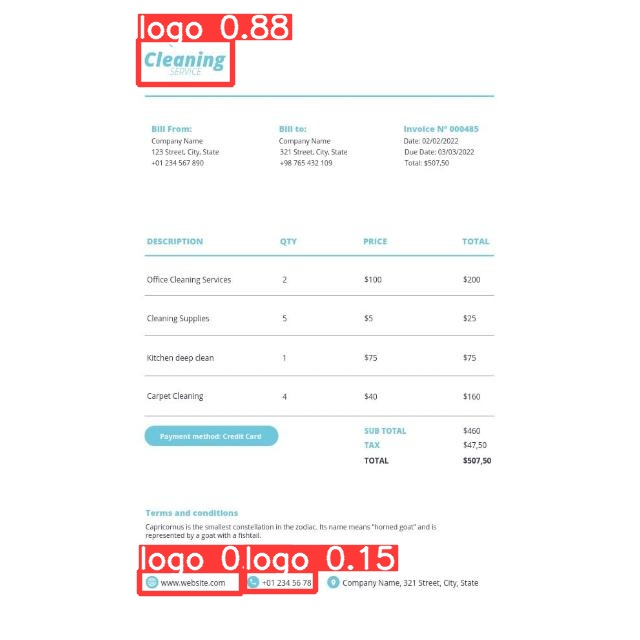

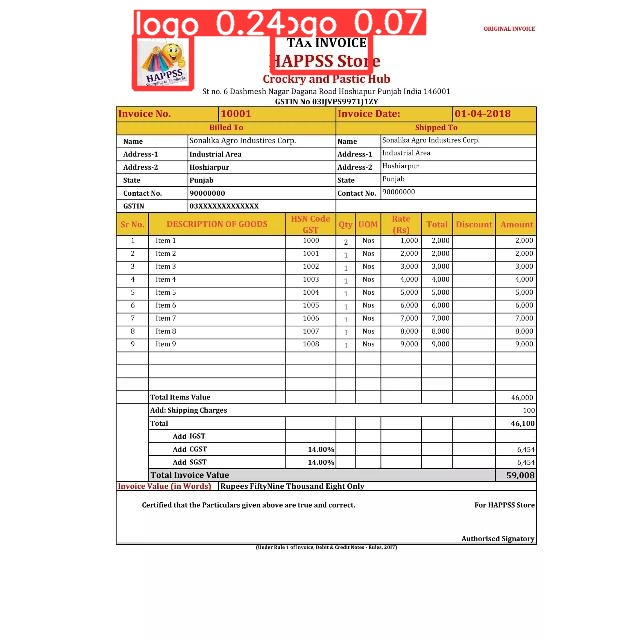

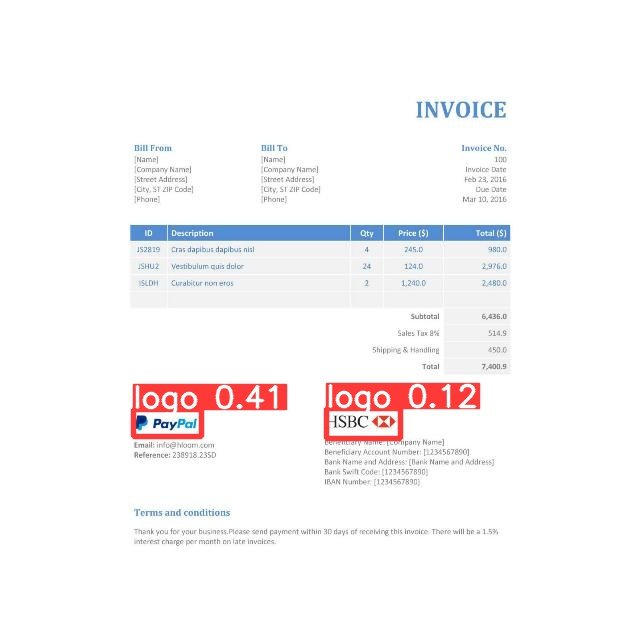

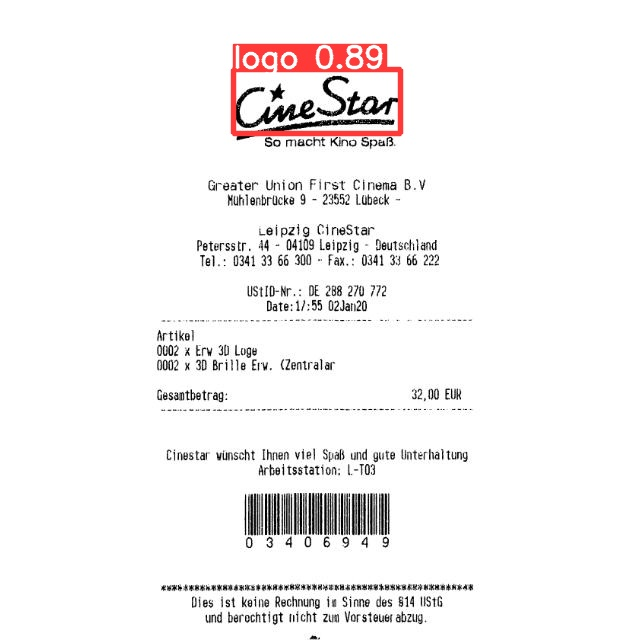

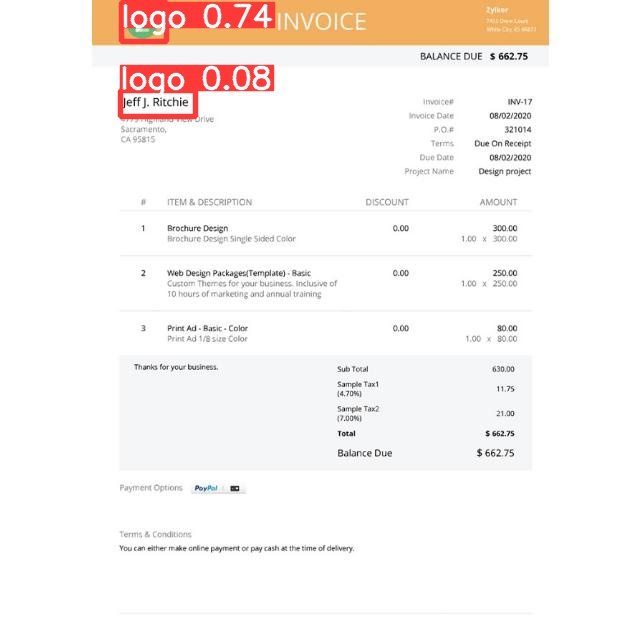

...

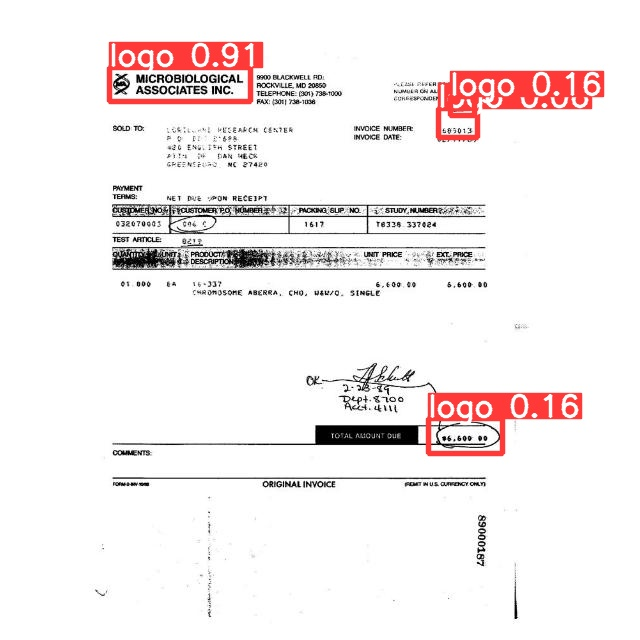

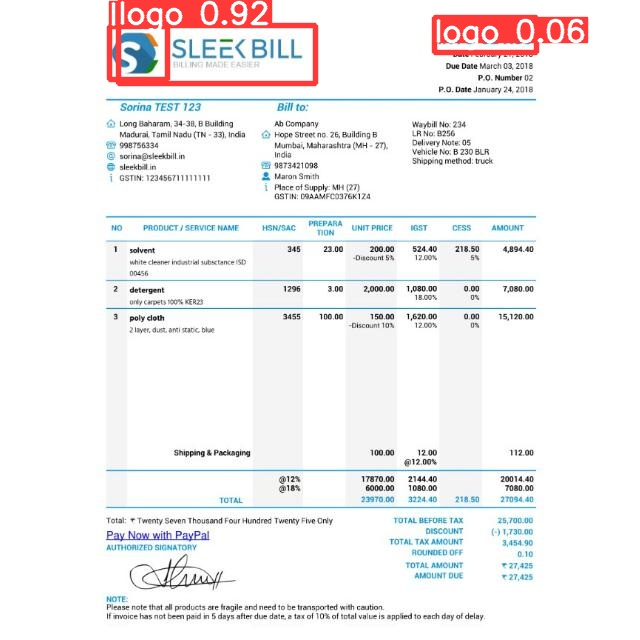

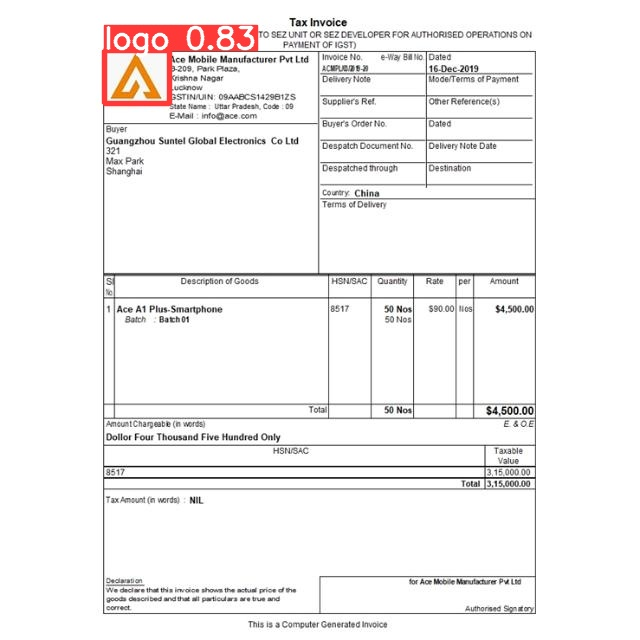

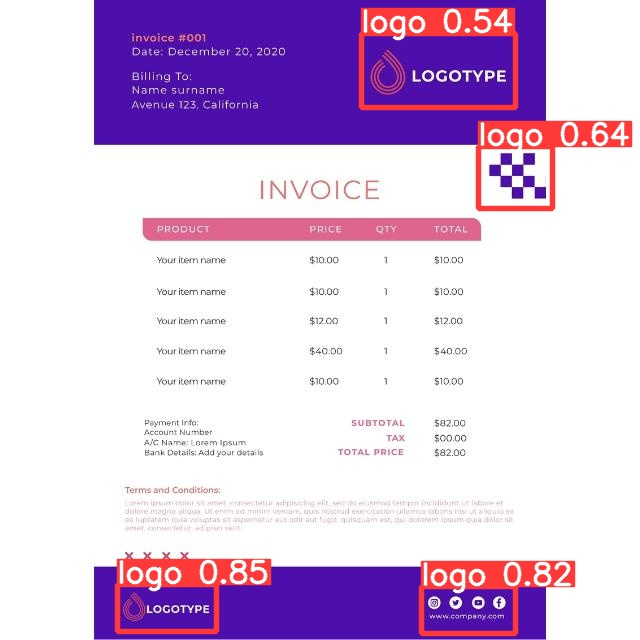

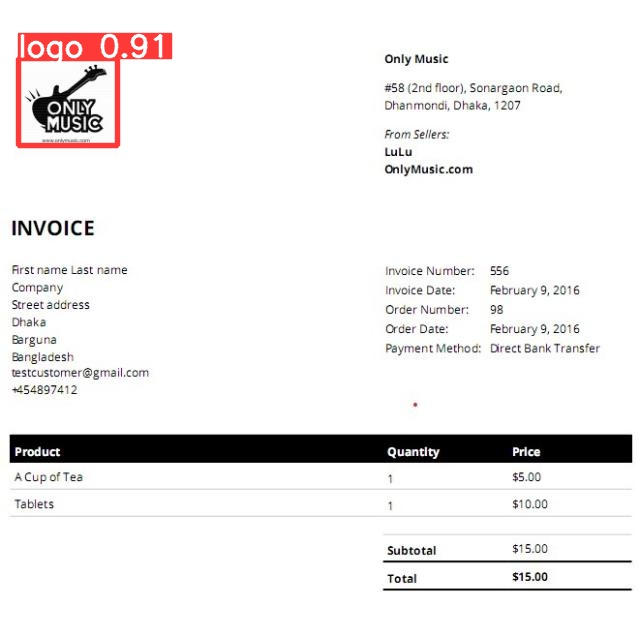

In [ ]:
import glob

for imageName in glob.glob('/content/yolov5/runs/detect/exp3/*.jpg'): 
    display(Image(filename=imageName))
    print("\n")

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os

In [ ]:
def yolobbox2bbox(x,y,w,h,size):
    x1, y1 = (x-w/2)*size, (y-h/2)*size
    x2, y2 = (x+w/2)*size, (y+h/2)*size
    
    return int(x1), int(y1), int(x2), int(y2)

In [ ]:
detections = []
labels_path = '/content/yolov5/runs/detect/exp3/labels'
for label in sorted(os.listdir(labels_path)):
  detections.append(np.loadtxt(os.path.join(labels_path,label)).reshape(-1,6))

test_img_path = '/content/yolov5/Logo-Detection-4/test/images'
test_images = [os.path.join(test_img_path, img) for img in sorted(os.listdir(test_img_path))]


In [ ]:
test_bbox_dir = '/content/drive/MyDrive/test/full'
test_cropped_dir = '/content/drive/MyDrive/test/cropped'

In [ ]:
for i, (detection, img_path) in enumerate(zip(detections,test_images)):
  if detection.shape[0] > 1:
    max_conf_ind = detection[:,-1].argmax()
    _, x, y, w, h, conf = detection[max_conf_ind]
  else:
    _, x, y, w, h, conf = detection[0]
  
  x1,y1,x2,y2 = yolobbox2bbox(x,y,w,h,SIZE)
  img = cv2.imread(img_path)
  new_img = img.copy()
  cv2.rectangle(new_img, (x1, y1), (x2, y2), (0, 0, 255), 2)
  font                   = cv2.FONT_HERSHEY_SIMPLEX
  fontScale              = 0.55
  fontColor              = (0,0,255)
  thickness              = 1
  lineType               = 2

  text = str(np.round(conf,3))
  text_width, text_height = cv2.getTextSize(text, font, fontScale, lineType)[0]
  if y1-5-text_height < 0:
    y_text = y2 + 5 + text_height
  else:
    y_text = y1-5

  bottomLeftCornerOfText = (x1+5,y_text)

  cv2.putText(new_img,text, 
    bottomLeftCornerOfText, 
    font, 
    fontScale,
    fontColor,
    thickness,
    lineType)
  
  cropped = img[y1:y2, x1:x2].copy()
  new_img_name = img_path.split('/')[-1].split('.')[0] + '_with_bbox' + '.jpg'
  new_img_name_cropped = img_path.split('/')[-1].split('.')[0] + '_cropped' + '.jpg'
  cv2.imwrite(os.path.join(test_bbox_dir, new_img_name), new_img)
  cv2.imwrite(os.path.join(test_cropped_dir, new_img_name_cropped), cropped)